<a href="https://colab.research.google.com/github/shishir-sh26/GenAi/blob/main/cat_image_generator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
spandan2_cats_faces_64x64_for_generative_models_path = kagglehub.dataset_download('spandan2/cats-faces-64x64-for-generative-models')

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/cats-faces-64x64-for-generative-models/cats/7981.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/12666.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/13288.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/6234.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/1269.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/3863.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/6241.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/10304.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/623.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/2193.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/14143.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/11925.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/3750.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats/11378.jpg
/kaggle/input/cats-faces-64x64-for-generative-models/cats

In [ ]:
import torch
import torch.nn as nn
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

# Hyperparameters
latent_dim = 100
image_size = 64
batch_size = 64

# 1. Generator Model
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            # Input: latent_dim x 1 x 1
            nn.ConvTranspose2d(latent_dim, 512, 4, 1, 0, bias=False),
            nn.BatchNorm2d(512), nn.ReLU(True),
            # 512 x 4 x 4
            nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256), nn.ReLU(True),
            # 256 x 8 x 8
            nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128), nn.ReLU(True),
            # 128 x 16 x 16
            nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False),
            nn.BatchNorm2d(64), nn.ReLU(True),
            # 64 x 32 x 32
            nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False),
            nn.Tanh() # Final output: 3 x 64 x 64
        )
    def forward(self, input):
        return self.main(input)

# 2. Discriminator Model
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256), nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(256, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )
    def forward(self, input):
        return self.main(input).view(-1, 1)

# Initialize Models
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
netG = Generator().to(device)
netD = Discriminator().to(device)

# Loss and Optimizer
criterion = nn.BCELoss()
optimizerD = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerG = torch.optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

In [ ]:
import numpy as np
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

# 1. Define the transformation (Resizing and Normalizing)
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    # Normalizes to [-1, 1] which is required for the 'Tanh' activation in the Generator
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

# 2. Point to the dataset folder
# Note: ImageFolder looks for subfolders, which 'cats' is.
dataset_path = '/kaggle/input/cats-faces-64x64-for-generative-models/'

dataset = datasets.ImageFolder(root=dataset_path, transform=transform)

# 3. Create the Dataloader
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2)

print(f"Successfully loaded {len(dataset)} images.")

Successfully loaded 31494 images.


In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Apply these weights to your models
netG.apply(weights_init)
netD.apply(weights_init)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (9): Sigmoid()
  )
)

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            # input is 3 x 64 x 64
            nn.Conv2d(3, 64, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 64 x 32 x 32
            nn.Conv2d(64, 128, 4, 2, 1, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 128 x 16 x 16
            nn.Conv2d(128, 256, 4, 2, 1, bias=False),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 256 x 8 x 8
            nn.Conv2d(256, 512, 4, 2, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),
            # state size: 512 x 4 x 4
            nn.Conv2d(512, 1, 4, 1, 0, bias=False),
            # final size: 1 x 1 x 1
            nn.Flatten(), # This ensures the output is (BatchSize, 1)
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

# Re-initialize
netD = Discriminator().to(device)
netD.apply(weights_init)
optimizerD = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))

Starting Training Loop...
[0/25][0/493] Loss_D: 1.8095 Loss_G: 6.0687
[0/25][50/493] Loss_D: 0.0082 Loss_G: 7.2301
[0/25][100/493] Loss_D: 0.3356 Loss_G: 5.1061
[0/25][150/493] Loss_D: 0.3646 Loss_G: 4.6927
[0/25][200/493] Loss_D: 0.9071 Loss_G: 4.5481
[0/25][250/493] Loss_D: 0.2816 Loss_G: 2.9113
[0/25][300/493] Loss_D: 0.9851 Loss_G: 6.5482
[0/25][350/493] Loss_D: 0.8666 Loss_G: 2.0656
[0/25][400/493] Loss_D: 0.2115 Loss_G: 6.2064
[0/25][450/493] Loss_D: 0.5774 Loss_G: 3.8864


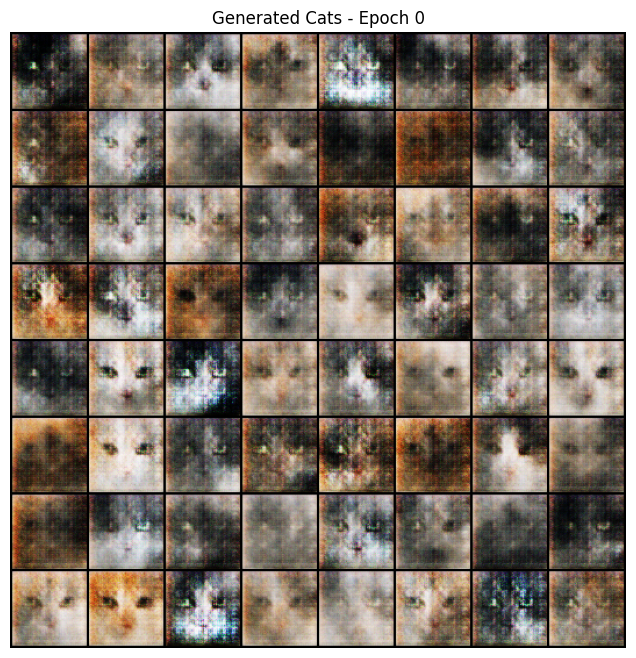

[1/25][0/493] Loss_D: 1.0940 Loss_G: 9.0812
[1/25][50/493] Loss_D: 0.6067 Loss_G: 8.4447
[1/25][100/493] Loss_D: 0.5563 Loss_G: 5.3977
[1/25][150/493] Loss_D: 0.4909 Loss_G: 6.5962
[1/25][200/493] Loss_D: 0.5276 Loss_G: 4.9313
[1/25][250/493] Loss_D: 0.5179 Loss_G: 3.6177
[1/25][300/493] Loss_D: 0.7658 Loss_G: 3.2509
[1/25][350/493] Loss_D: 1.4424 Loss_G: 9.3706
[1/25][400/493] Loss_D: 0.8215 Loss_G: 7.6750
[1/25][450/493] Loss_D: 0.7117 Loss_G: 4.2103


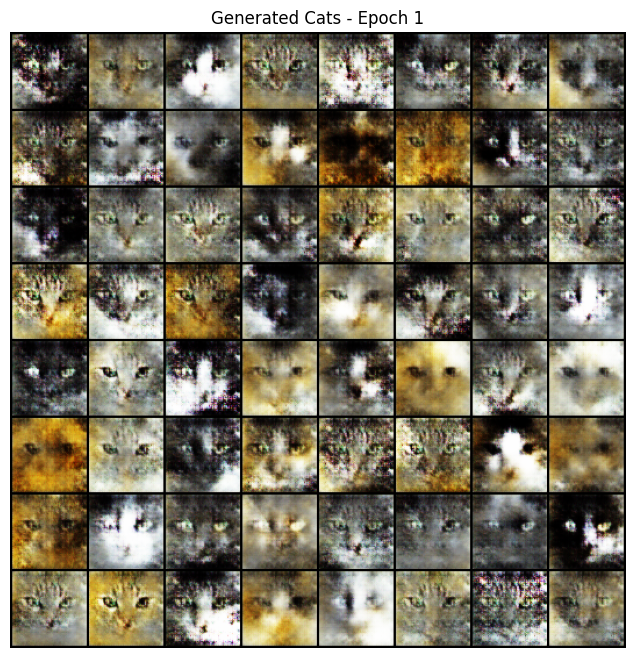

[2/25][0/493] Loss_D: 3.3510 Loss_G: 8.9949
[2/25][50/493] Loss_D: 0.5428 Loss_G: 4.4625
[2/25][100/493] Loss_D: 0.7680 Loss_G: 3.8240
[2/25][150/493] Loss_D: 0.4075 Loss_G: 4.9660
[2/25][200/493] Loss_D: 0.5555 Loss_G: 3.7812
[2/25][250/493] Loss_D: 0.5466 Loss_G: 5.4796
[2/25][300/493] Loss_D: 0.6306 Loss_G: 2.5692
[2/25][350/493] Loss_D: 0.9166 Loss_G: 5.1235
[2/25][400/493] Loss_D: 0.6531 Loss_G: 5.1714
[2/25][450/493] Loss_D: 0.5471 Loss_G: 3.8829


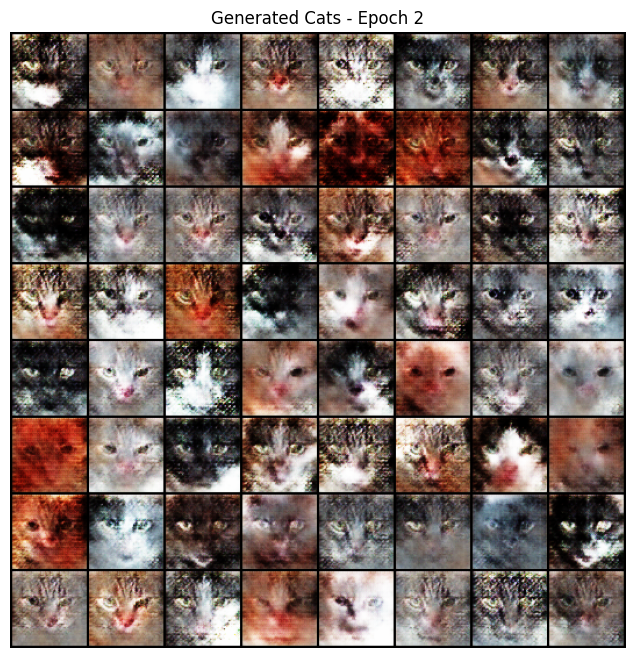

[3/25][0/493] Loss_D: 1.2936 Loss_G: 8.9401
[3/25][50/493] Loss_D: 0.5558 Loss_G: 4.1807
[3/25][100/493] Loss_D: 0.4284 Loss_G: 5.3301
[3/25][150/493] Loss_D: 0.6558 Loss_G: 3.4464
[3/25][200/493] Loss_D: 1.4056 Loss_G: 5.1361
[3/25][250/493] Loss_D: 0.5670 Loss_G: 3.9074
[3/25][300/493] Loss_D: 0.8887 Loss_G: 2.8949
[3/25][350/493] Loss_D: 0.4788 Loss_G: 3.8062
[3/25][400/493] Loss_D: 0.5252 Loss_G: 4.7299
[3/25][450/493] Loss_D: 0.4700 Loss_G: 5.5049


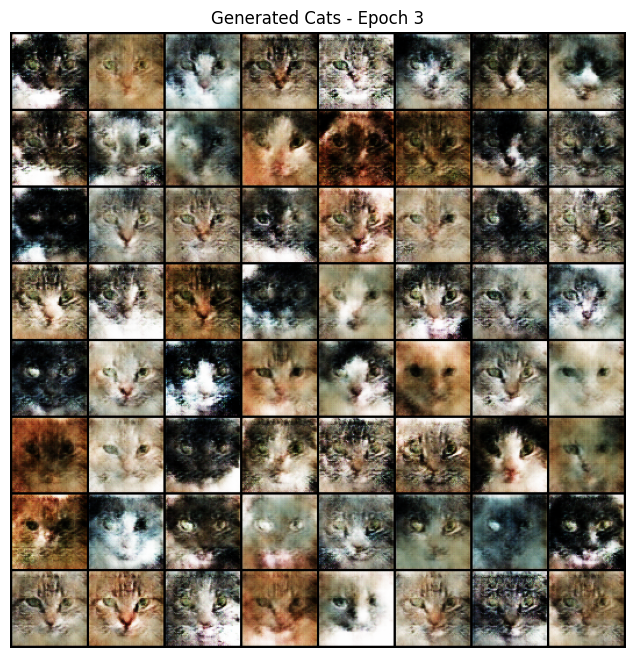

[4/25][0/493] Loss_D: 1.0581 Loss_G: 7.6343
[4/25][50/493] Loss_D: 0.9570 Loss_G: 6.8125
[4/25][100/493] Loss_D: 0.6079 Loss_G: 3.1052
[4/25][150/493] Loss_D: 0.6862 Loss_G: 7.3971
[4/25][200/493] Loss_D: 0.4399 Loss_G: 5.1186
[4/25][250/493] Loss_D: 0.6262 Loss_G: 5.9266
[4/25][300/493] Loss_D: 0.8556 Loss_G: 5.2922
[4/25][350/493] Loss_D: 0.4175 Loss_G: 4.1557
[4/25][400/493] Loss_D: 0.6165 Loss_G: 4.8276
[4/25][450/493] Loss_D: 0.2088 Loss_G: 5.6826


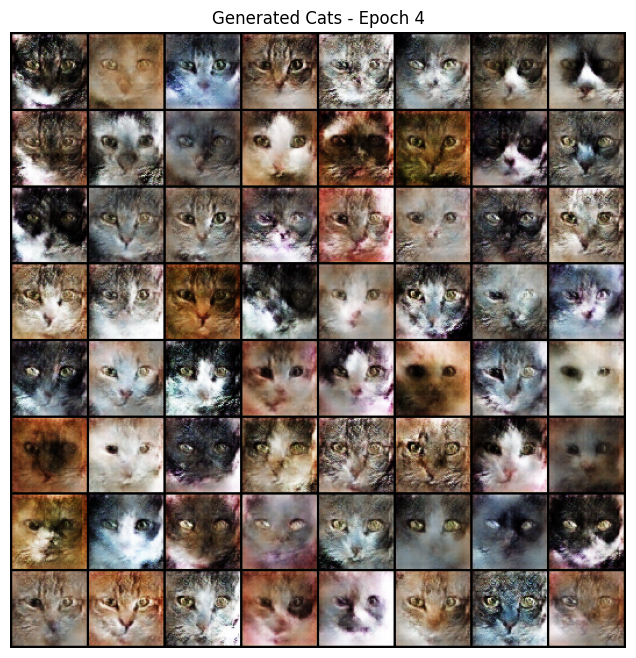

[5/25][0/493] Loss_D: 1.5400 Loss_G: 10.6592
[5/25][50/493] Loss_D: 0.5008 Loss_G: 6.6321
[5/25][100/493] Loss_D: 0.4864 Loss_G: 3.6503
[5/25][150/493] Loss_D: 0.2805 Loss_G: 4.8706
[5/25][200/493] Loss_D: 0.2134 Loss_G: 3.6504
[5/25][250/493] Loss_D: 0.4234 Loss_G: 6.4199
[5/25][300/493] Loss_D: 1.4780 Loss_G: 10.4311
[5/25][350/493] Loss_D: 0.8241 Loss_G: 2.3883
[5/25][400/493] Loss_D: 0.7145 Loss_G: 2.1181
[5/25][450/493] Loss_D: 0.3551 Loss_G: 4.3876


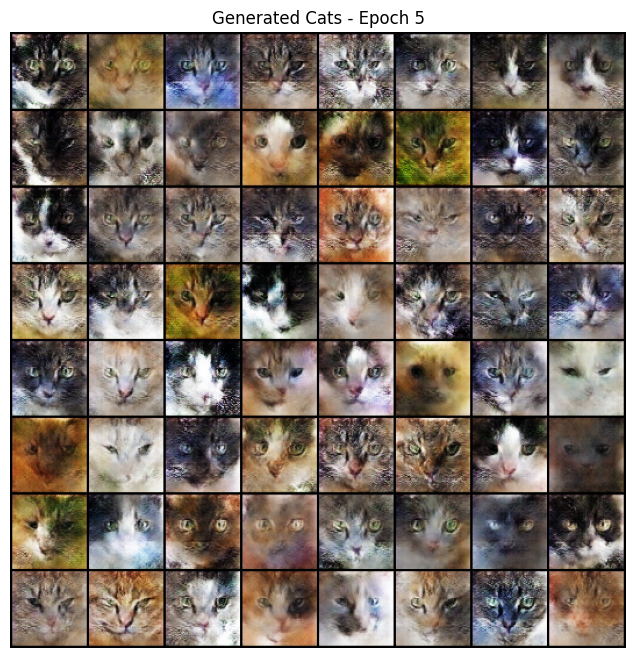

[6/25][0/493] Loss_D: 1.5856 Loss_G: 9.8624
[6/25][50/493] Loss_D: 0.4417 Loss_G: 4.5340
[6/25][100/493] Loss_D: 0.5658 Loss_G: 3.6837
[6/25][150/493] Loss_D: 0.7204 Loss_G: 7.6408
[6/25][200/493] Loss_D: 0.3956 Loss_G: 5.5229
[6/25][250/493] Loss_D: 0.8511 Loss_G: 8.7309
[6/25][300/493] Loss_D: 0.6932 Loss_G: 6.4875
[6/25][350/493] Loss_D: 0.5476 Loss_G: 4.7042
[6/25][400/493] Loss_D: 0.3312 Loss_G: 3.6489
[6/25][450/493] Loss_D: 0.5464 Loss_G: 3.7730


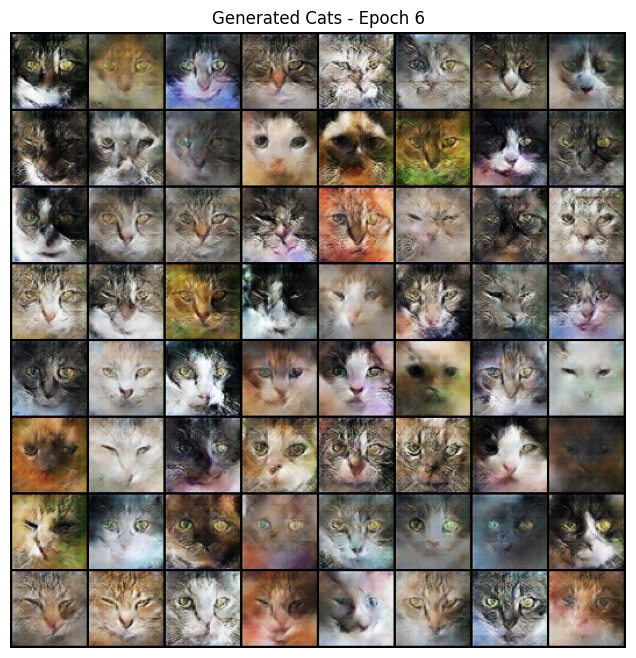

[7/25][0/493] Loss_D: 0.6665 Loss_G: 3.0939
[7/25][50/493] Loss_D: 0.4970 Loss_G: 3.1238
[7/25][100/493] Loss_D: 0.7522 Loss_G: 7.3864
[7/25][150/493] Loss_D: 0.8701 Loss_G: 2.5273
[7/25][200/493] Loss_D: 0.2545 Loss_G: 3.9725
[7/25][250/493] Loss_D: 0.3526 Loss_G: 4.8389
[7/25][300/493] Loss_D: 0.5161 Loss_G: 3.4499
[7/25][350/493] Loss_D: 0.3338 Loss_G: 4.3115
[7/25][400/493] Loss_D: 0.3876 Loss_G: 3.2780
[7/25][450/493] Loss_D: 0.4652 Loss_G: 2.9387


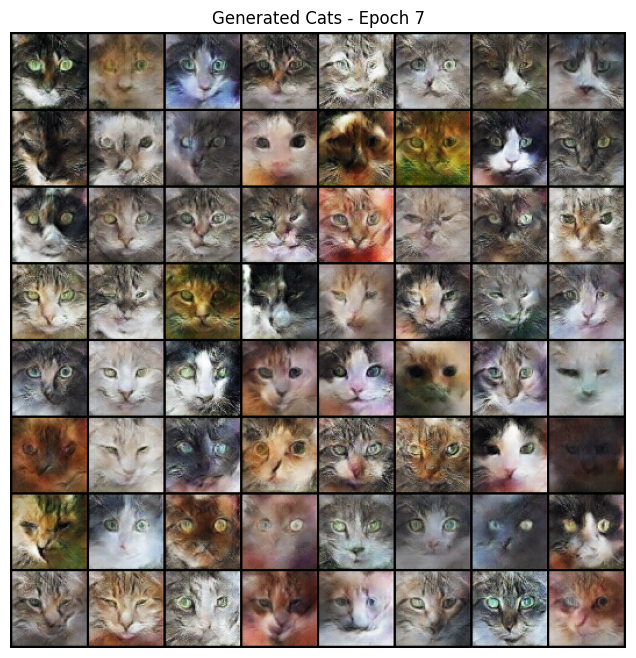

[8/25][0/493] Loss_D: 1.1981 Loss_G: 9.4466
[8/25][50/493] Loss_D: 0.7867 Loss_G: 8.2640
[8/25][100/493] Loss_D: 0.5388 Loss_G: 4.1503
[8/25][150/493] Loss_D: 0.3815 Loss_G: 5.1409
[8/25][200/493] Loss_D: 0.5703 Loss_G: 4.6712
[8/25][250/493] Loss_D: 0.5268 Loss_G: 3.9673
[8/25][300/493] Loss_D: 0.2856 Loss_G: 4.0963
[8/25][350/493] Loss_D: 0.5795 Loss_G: 4.8201
[8/25][400/493] Loss_D: 0.2502 Loss_G: 4.0951
[8/25][450/493] Loss_D: 0.2021 Loss_G: 4.8265


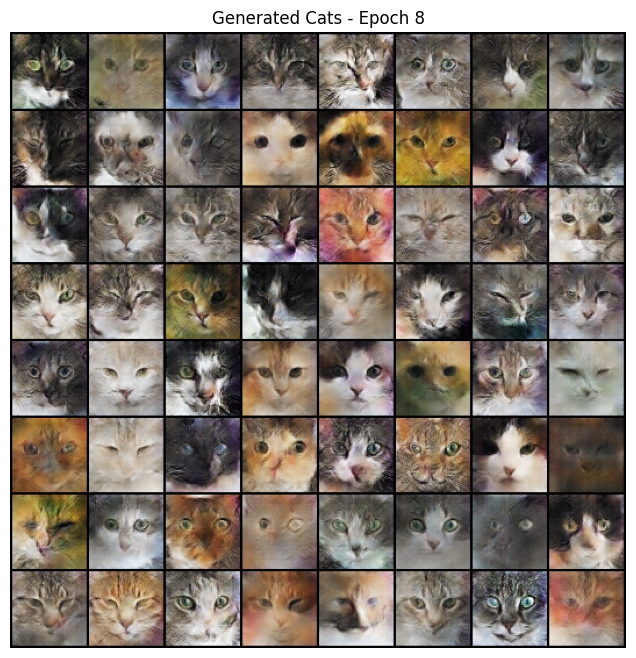

[9/25][0/493] Loss_D: 1.9466 Loss_G: 1.3761
[9/25][50/493] Loss_D: 0.4959 Loss_G: 2.2887
[9/25][100/493] Loss_D: 0.9883 Loss_G: 2.5236
[9/25][150/493] Loss_D: 0.9097 Loss_G: 3.5150
[9/25][200/493] Loss_D: 0.4329 Loss_G: 2.8642
[9/25][250/493] Loss_D: 0.3352 Loss_G: 3.6985
[9/25][300/493] Loss_D: 0.1849 Loss_G: 4.7010
[9/25][350/493] Loss_D: 0.5045 Loss_G: 4.8127
[9/25][400/493] Loss_D: 0.4296 Loss_G: 4.3439
[9/25][450/493] Loss_D: 2.9130 Loss_G: 1.8746


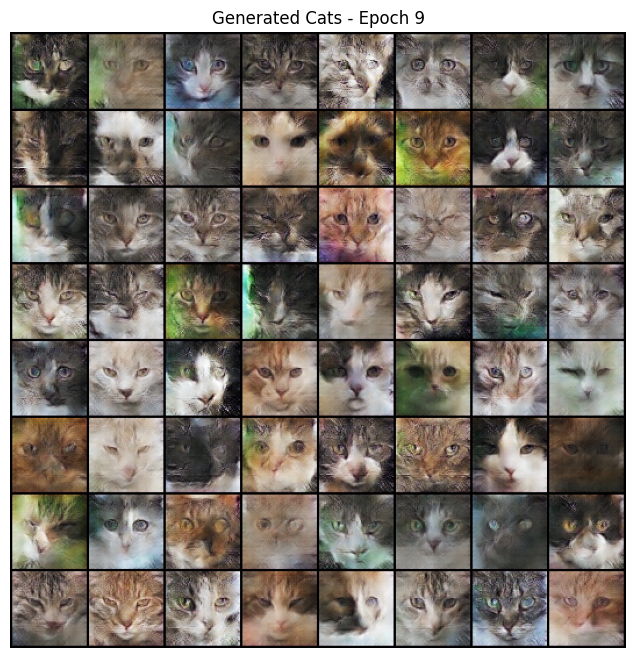

[10/25][0/493] Loss_D: 0.2591 Loss_G: 6.0484
[10/25][50/493] Loss_D: 0.4237 Loss_G: 3.2204
[10/25][100/493] Loss_D: 0.2843 Loss_G: 5.7369
[10/25][150/493] Loss_D: 0.2691 Loss_G: 4.1962
[10/25][200/493] Loss_D: 0.3085 Loss_G: 4.4966
[10/25][250/493] Loss_D: 0.3338 Loss_G: 4.5977
[10/25][300/493] Loss_D: 0.3009 Loss_G: 5.2148
[10/25][350/493] Loss_D: 1.1146 Loss_G: 3.5241
[10/25][400/493] Loss_D: 0.2671 Loss_G: 3.3874
[10/25][450/493] Loss_D: 0.3025 Loss_G: 3.2394


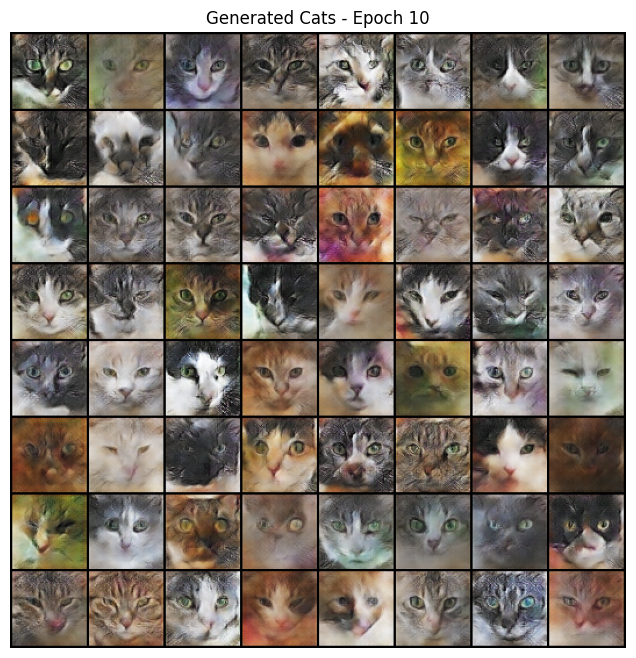

[11/25][0/493] Loss_D: 0.1762 Loss_G: 4.8203
[11/25][50/493] Loss_D: 0.5744 Loss_G: 2.3003
[11/25][100/493] Loss_D: 0.2547 Loss_G: 4.3653
[11/25][150/493] Loss_D: 0.2043 Loss_G: 3.3028
[11/25][200/493] Loss_D: 0.2813 Loss_G: 3.1069
[11/25][250/493] Loss_D: 0.7472 Loss_G: 1.5258
[11/25][300/493] Loss_D: 0.1250 Loss_G: 4.7114
[11/25][350/493] Loss_D: 0.2746 Loss_G: 5.8635
[11/25][400/493] Loss_D: 0.3027 Loss_G: 2.8195
[11/25][450/493] Loss_D: 0.1971 Loss_G: 3.5602


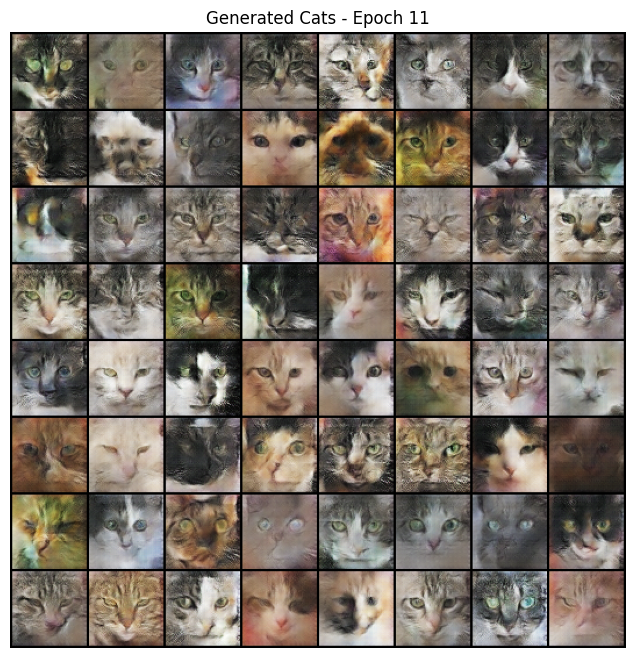

[12/25][0/493] Loss_D: 0.4111 Loss_G: 4.0405
[12/25][50/493] Loss_D: 0.1320 Loss_G: 3.8898
[12/25][100/493] Loss_D: 0.1374 Loss_G: 4.9066
[12/25][150/493] Loss_D: 0.5548 Loss_G: 1.9293
[12/25][200/493] Loss_D: 0.3858 Loss_G: 2.5985
[12/25][250/493] Loss_D: 0.5128 Loss_G: 7.8917
[12/25][300/493] Loss_D: 0.6497 Loss_G: 3.9054
[12/25][350/493] Loss_D: 0.1143 Loss_G: 4.5433
[12/25][400/493] Loss_D: 0.0800 Loss_G: 4.5070
[12/25][450/493] Loss_D: 0.3356 Loss_G: 4.5493


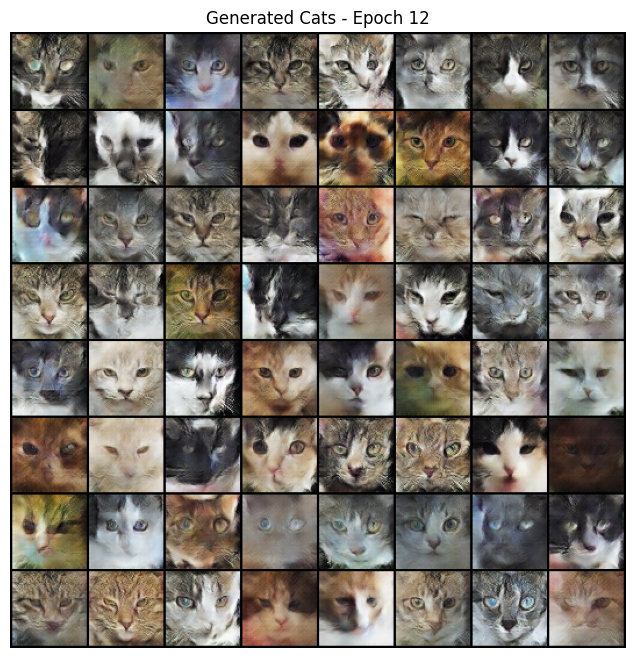

[13/25][0/493] Loss_D: 0.2539 Loss_G: 6.2825
[13/25][50/493] Loss_D: 0.1215 Loss_G: 5.3575
[13/25][100/493] Loss_D: 0.6843 Loss_G: 7.7156
[13/25][150/493] Loss_D: 3.0065 Loss_G: 11.5028
[13/25][200/493] Loss_D: 0.7377 Loss_G: 2.7244
[13/25][250/493] Loss_D: 0.3226 Loss_G: 3.5281
[13/25][300/493] Loss_D: 0.5413 Loss_G: 6.5212
[13/25][350/493] Loss_D: 0.1422 Loss_G: 3.5251
[13/25][400/493] Loss_D: 0.1676 Loss_G: 4.4299
[13/25][450/493] Loss_D: 0.1139 Loss_G: 3.1671


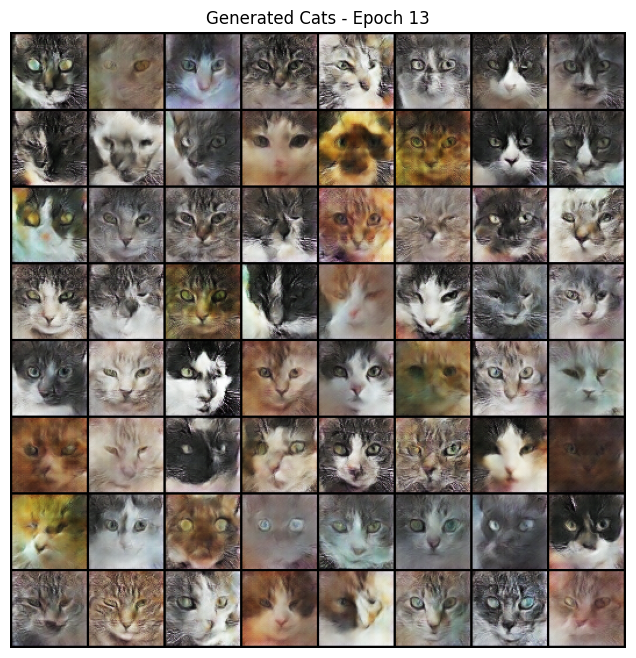

[14/25][0/493] Loss_D: 0.2417 Loss_G: 5.3531
[14/25][50/493] Loss_D: 0.3535 Loss_G: 4.6780
[14/25][100/493] Loss_D: 0.2919 Loss_G: 7.3567
[14/25][150/493] Loss_D: 0.2650 Loss_G: 3.5813
[14/25][200/493] Loss_D: 0.1328 Loss_G: 3.8236
[14/25][250/493] Loss_D: 0.0777 Loss_G: 4.1769
[14/25][300/493] Loss_D: 0.4153 Loss_G: 2.6229
[14/25][350/493] Loss_D: 0.3810 Loss_G: 3.8586
[14/25][400/493] Loss_D: 0.3351 Loss_G: 5.9282
[14/25][450/493] Loss_D: 0.2254 Loss_G: 3.2021


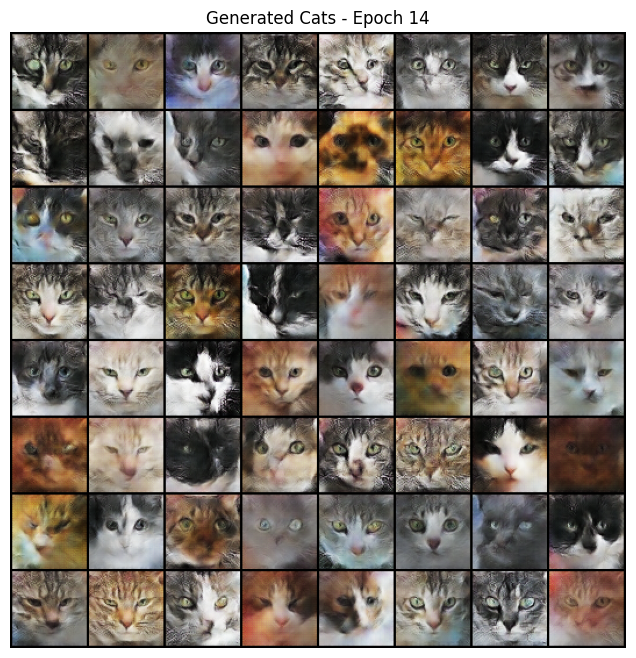

[15/25][0/493] Loss_D: 0.9037 Loss_G: 3.6763
[15/25][50/493] Loss_D: 0.4060 Loss_G: 3.7046
[15/25][100/493] Loss_D: 0.3240 Loss_G: 2.8993
[15/25][150/493] Loss_D: 0.1103 Loss_G: 5.5873
[15/25][200/493] Loss_D: 0.1853 Loss_G: 5.2637
[15/25][250/493] Loss_D: 0.4085 Loss_G: 1.3364


In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Tracking variables
img_list = []
G_losses = []
D_losses = []
iters = 0
num_epochs = 25  # Start with 25; you can increase this later

print("Starting Training Loop...")

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):

        # --- (1) Update Discriminator (D) ---
        netD.zero_grad()
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), 1.0, dtype=torch.float, device=device) # Real = 1

        # Pass real images through D
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()

        # Generate fake images and pass through D
        noise = torch.randn(b_size, latent_dim, 1, 1, device=device)
        fake = netG(noise)
        label.fill_(0.0) # Fake = 0
        output = netD(fake.detach()).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()

        optimizerD.step()

        # --- (2) Update Generator (G) ---
        netG.zero_grad()
        label.fill_(1.0) # Generator wants D to think fakes are Real (1)
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        errG.backward()
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print(f'[{epoch}/{num_epochs}][{i}/{len(dataloader)}] Loss_D: {errD_real+errD_fake:.4f} Loss_G: {errG:.4f}')

    # After each epoch, show us what the Generator is making
    with torch.no_grad():
        fake = netG(fixed_noise).detach().cpu()
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title(f"Generated Cats - Epoch {epoch}")
    plt.imshow(np.transpose(vutils.make_grid(fake, padding=2, normalize=True), (1,2,0)))
    plt.show()